# 1. Exploratory data analysis

In [2]:
# File path
richtingen = "D:/KUL MSDS 1/mda_project/data/richtingen.csv"
sites = "D:/KUL MSDS 1/mda_project/data/sites.csv"
traffic_path = r"D:\KUL MSDS 1\mda_project\data\traffic" 

import pandas as pd
import os
import matplotlib.pyplot as plt
import seaborn as sns

In [36]:
pd.options.display.max_columns=1000
pd.options.display.max_rows=1000

## 1.1. Richtingen dataset

In [5]:
rich_df = pd.read_csv(richtingen, header=None)
rich_df.columns = ["siteid", "richting", "naam"]
rich_df.head()

,siteid,richting,naam
0,1,IN,Machelen Cyclists rich. Brucargo
1,1,OUT,Machelen Cyclists richting Machelen
2,2,IN,Brasschaat 2 Fietsers rich Merksem
3,2,OUT,Brasschaat 2 Fietsers rich Brasschaat
4,3,IN,Brasschaat 1 Fietsers rich Merksem


In [38]:
rich_df.shape

(304, 3)

In [39]:
siteid_counts = rich_df["siteid"].value_counts()
siteid_counts

siteid
7      3
102    3
34     3
4      2
5      2
2      2
1      2
10     2
19     2
21     2
20     2
23     2
24     2
25     2
22     2
26     2
27     2
29     2
28     2
30     2
31     2
6      2
3      2
33     2
32     2
36     2
35     2
38     2
144    2
145    2
37     2
9      2
11     2
12     2
13     2
14     2
15     2
16     2
8      2
18     2
39     2
40     2
44     2
45     2
46     2
47     2
48     2
49     2
50     2
51     2
52     2
53     2
54     2
55     2
17     2
42     2
43     2
56     2
57     2
58     2
59     2
60     2
61     2
62     2
63     2
78     2
79     2
80     2
81     2
82     2
83     2
84     2
85     2
86     2
87     2
88     2
89     2
90     2
64     2
65     2
66     2
67     2
68     2
69     2
70     2
77     2
41     2
91     2
92     2
94     2
93     2
96     2
97     2
98     2
95     2
99     2
100    2
101    2
105    2
106    2
107    2
108    2
109    2
110    2
71     2
72     2
73     2
74     2
75     2
76     2
103

In [40]:
unpaired_sites = siteid_counts[siteid_counts != 2].index.tolist()
unpaired_sites # 4 sites missing an IN or OUT partner row (7, 102, 34, 141)

[7, 102, 34, 141]

In [41]:
rich_df['from'] = rich_df['naam'].apply(lambda x: x.split()[0])
rich_df['to'] = rich_df['naam'].apply(lambda x: x.split()[-1])

rich_df[['from','to']].drop_duplicates().tail(20)

,from,to
283,YTH17062596,IN
284,YTH17062596,OUT
285,Overijse,UIT
286,Overijse,IN]
287,Overijse,OUT]
288,Overijse,Ijsebos]
289,Test,IN
290,TEST,IN
291,TEST,UIT
293,Overijse,Nieuwland]


In [42]:
rich_df = rich_df.query('richting!="IN/OUT"') # filter out side id with error IN and OUT
print(rich_df.shape)
print(rich_df['siteid'].nunique())

(300, 5)
151


## 1.2. Sites dataset

In [4]:
sites_df = pd.read_csv(sites, header=None)
sites_df.columns = ['siteid', 'sitenr', 'long', 'lat', 'naam', 'domein', 'wegnr', 'district', 'gemeente', 'interval', 'datum_van']
sites_df.head()

,siteid,sitenr,long,lat,naam,domein,wegnr,district,gemeente,interval,datum_van
0,1,100046096,4.456122,50.916183,Machelen,Vlaamse Overheid A. Wegen enVerkeer,T2110002,AWV212,Machelen,15,2019-08-22
1,2,100052862,4.471690,51.275120,Brasschaat 2,Vlaamse Overheid A. Wegen enVerkeer,N0010002,AWV123,Brasschaat,15,2019-08-22
2,3,100052863,4.472220,51.275030,Brasschaat 1,Vlaamse Overheid A. Wegen enVerkeer,N0010001,AWV123,Brasschaat,15,2019-08-22
3,4,100052864,5.190110,51.160230,Balen 1,Vlaamse Overheid A. Wegen enVerkeer,N0180002,AWV114,Balen,15,2019-08-22
4,5,100052865,5.190030,51.160180,Balen 2,Vlaamse Overheid A. Wegen enVerkeer,N0180002,AWV114,Balen,15,2019-08-22


In [44]:
sites_df.shape

(150, 11)

In [45]:
sites_df['domein'].value_counts()

domein
Vlaamse Overheid A. Wegen enVerkeer     141
Vlaamse Overheid A. Wegen en Verkeer      8
Kortrijk Fietst                           1
Name: count, dtype: int64

In [46]:
sites_df.describe()

,siteid,sitenr,long,lat,interval
count,150.000000,1.500000e+02,150.000000,150.000000,150.000000
mean,76.646667,2.666990e+08,4.364270,51.011156,14.800000
std,43.663776,7.477630e+07,0.812947,0.154632,4.593547
min,2.000000,1.000389e+08,2.742890,50.751280,0.000000
25%,39.250000,3.000235e+08,3.768200,50.886809,15.000000
50%,76.500000,3.000256e+08,4.471955,50.990617,15.000000
75%,113.750000,3.000274e+08,4.938605,51.134372,15.000000
max,152.000000,3.000621e+08,5.797260,51.357520,60.000000


In [47]:
sites_df['wegnr'].apply(lambda x: str(x)[0]).unique()

array(['N', 'R', 'T', 'A', 'n'], dtype=object)

In [48]:
sites_df[['siteid','long','lat','naam']].rename(columns={'long':'longtitude','lat':'latitude',}).to_csv('D:\KUL MSDS 1\mda_project\data\site_latlong.csv', index=False)

In [49]:
print(sites_df['datum_van'].min())
print(sites_df['datum_van'].max())

2019-08-22
2025-10-31


In [50]:
print(sites_df['siteid'].nunique())
print(sites_df['sitenr'].nunique())

150
150


### 1.2.1. Site overview and distribution

Total unique sites: 150


,start_year,number_of_sites
0,2019,23
1,2020,1
2,2021,2
3,2022,102
4,2023,13
5,2024,1
6,2025,8


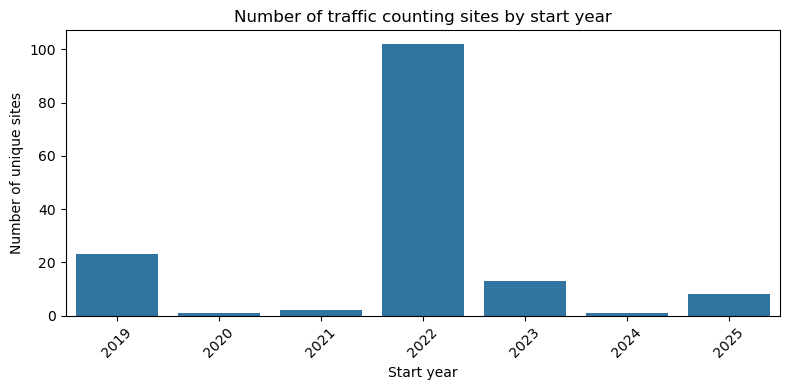

In [51]:
# Counting site trends 

sites_df["datum_van"] = pd.to_datetime(sites_df["datum_van"], errors="coerce")
sites_df["start_year"] = sites_df["datum_van"].dt.year

total_unique_sites = sites_df["siteid"].nunique()
print(f"Total unique sites: {total_unique_sites}")

sites_by_year = (
    sites_df.groupby("start_year")["siteid"]
    .nunique()
    .reset_index(name="number_of_sites")
    .dropna()
)

display(sites_by_year) # uneven distribution, with 2022 having the most coverage (102)

plt.figure(figsize=(8, 4))
sns.barplot(data=sites_by_year, x="start_year", y="number_of_sites")
plt.title("Number of traffic counting sites by start year")
plt.xlabel("Start year")
plt.ylabel("Number of unique sites")
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()   

,gemeente,number_of_sites
0,Brugge,7
1,Leuven,6
2,Kortrijk,5
3,Gent,4
4,Westerlo,4
5,Nieuwpoort,4
6,District Vilvoorde-gewestwegen,4
7,Hasselt,3
8,Lokeren,3
9,District Leuven,3


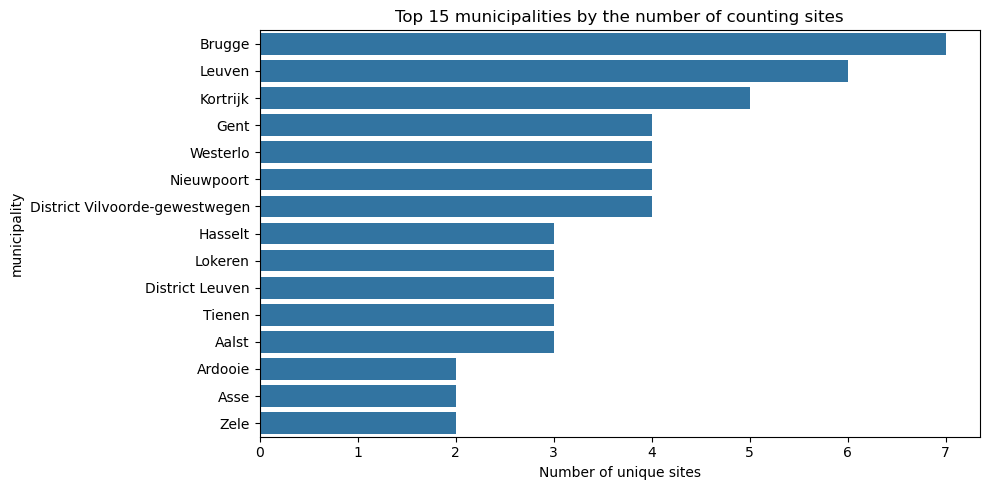

In [ ]:
# Counting sites by municipalities

site_distribution = (
    sites_df.groupby("gemeente")["siteid"]
    .nunique()
    .sort_values(ascending=False)
    .head(15)
    .reset_index(name="number_of_sites")
)

display(site_distribution)

plt.figure(figsize=(10, 5))
sns.barplot(data=site_distribution, x="number_of_sites", y="gemeente")
plt.title("Top 15 municipalities by the number of counting sites")
plt.xlabel("Number of unique sites")
plt.ylabel("municipality")
plt.tight_layout()
plt.show() #  Brugge, Leuven, Kortrijk have a slightly higher of sites than other cities in top 10

## 1.3. Traffic dataset

In [53]:
total_files = 0
total_rows = 0

for file in os.listdir(traffic_path):
    if file.startswith("data"):
        filepath = os.path.join(traffic_path, file)
        df = pd.read_csv(filepath, header=None)
        print(file, df.shape)
        total_files += 1
        total_rows += len(df)

print(f"\nTotal files: {total_files}")
print(f"Total rows: {total_rows}")

data-2019-08.csv (123148, 6)
data-2019-09.csv (138240, 6)
data-2019-10.csv (142848, 6)
data-2019-11.csv (138240, 6)
data-2019-12.csv (142848, 6)
data-2020-01.csv (142848, 6)
data-2020-02.csv (133632, 6)
data-2020-03.csv (142656, 6)
data-2020-04.csv (144000, 6)
data-2020-05.csv (148800, 6)
data-2020-06.csv (144000, 6)
data-2020-07.csv (148800, 6)
data-2020-08.csv (148800, 6)
data-2020-09.csv (144000, 6)
data-2020-10.csv (148800, 6)
data-2020-11.csv (144000, 6)
data-2020-12.csv (148800, 6)
data-2021-01.csv (148800, 6)
data-2021-02.csv (134400, 6)
data-2021-03.csv (148600, 6)
data-2021-04.csv (144000, 6)
data-2021-05.csv (148800, 6)
data-2021-06.csv (144000, 6)
data-2021-07.csv (156864, 6)
data-2021-08.csv (160704, 6)
data-2021-09.csv (155520, 6)
data-2021-10.csv (160704, 6)
data-2021-11.csv (155520, 6)
data-2021-12.csv (160704, 6)
data-2022-01.csv (160704, 6)
data-2022-02.csv (145152, 6)
data-2022-03.csv (203704, 6)
data-2022-04.csv (267250, 6)
data-2022-05.csv (368518, 6)
data-2022-06.c

### 1.3.1. Monthly traffic pattern

How does cyclist traffic changes across the months?

,year,month,total_cyclist_traffic,year_month
0,2019,8,274894.0,2019-08-01
1,2019,9,343393.0,2019-09-01
2,2019,10,286475.0,2019-10-01
3,2019,11,238230.0,2019-11-01
4,2019,12,198679.0,2019-12-01


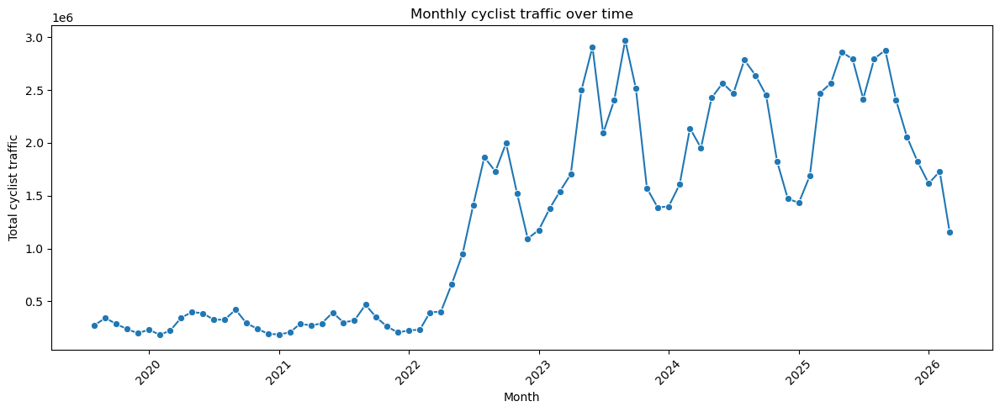

In [54]:
# How does cyclist traffic change across months?

traffic_columns = ["siteid", "richting", "type", "van", "tot", "aantal"]
monthly_list = []

for file in os.listdir(traffic_path):
    if file.startswith("data") and file.endswith(".csv"):
        filepath = os.path.join(traffic_path, file)
        df = pd.read_csv(filepath, header=None, names=traffic_columns)

        df["van"] = pd.to_datetime(df["van"], errors="coerce")
        df["aantal"] = pd.to_numeric(df["aantal"], errors="coerce")

        df = df[df["van"].notna()]
        df = df[df["aantal"].notna()]
        df = df[df["type"].astype(str).str.upper().eq("FIETSERS")]

        df["year"] = df["van"].dt.year
        df["month"] = df["van"].dt.month

        monthly_agg = (
            df.groupby(["year", "month"], as_index=False)["aantal"]
            .sum()
            .rename(columns={"aantal": "total_cyclist_traffic"})
        )

        monthly_list.append(monthly_agg)

monthly_traffic = pd.concat(monthly_list, ignore_index=True)
monthly_traffic = (
    monthly_traffic.groupby(["year", "month"], as_index=False)["total_cyclist_traffic"]
    .sum()
)

monthly_traffic["year_month"] = pd.to_datetime(
    monthly_traffic["year"].astype(str) + "-" + monthly_traffic["month"].astype(str) + "-01"
)

display(monthly_traffic.head())

plt.figure(figsize=(12, 5))
sns.lineplot(data=monthly_traffic, x="year_month", y="total_cyclist_traffic", marker="o")
plt.title("Monthly cyclist traffic over time")
plt.xlabel("Month")
plt.ylabel("Total cyclist traffic")
plt.xticks(rotation=45)
plt.tight_layout()
plt.show() # Monthly cyclist traffic shows a clear increase from 2022 onward, though fluctuated and decreased gradually since 2026

In [55]:
# Explore traffic: data-2026-03
march2026_df = pd.read_csv("D:/KUL MSDS 1/mda_project/data/traffic/data-2026-03.csv", header=0)
march2026_df.columns=['siteid', 'richting', 'type', 'van', 'tot', 'aantal']
print(march2026_df.shape)
print(march2026_df.head())

(351505, 6)
   siteid richting      type                    van                    tot  \
0       1       IN  FIETSERS  2026-03-01 00:15:00.0  2026-03-01 00:30:00.0   
1       1       IN  FIETSERS  2026-03-01 00:30:00.0  2026-03-01 00:45:00.0   
2       1       IN  FIETSERS  2026-03-01 00:45:00.0  2026-03-01 01:00:00.0   
3       1       IN  FIETSERS  2026-03-01 01:00:00.0  2026-03-01 01:15:00.0   
4       1       IN  FIETSERS  2026-03-01 01:15:00.0  2026-03-01 01:30:00.0   

   aantal  
0     0.0  
1     0.0  
2     0.0  
3     1.0  
4     0.0  


In [56]:
march2026_df.info

<bound method DataFrame.info of         siteid richting      type                    van  \
0            1       IN  FIETSERS  2026-03-01 00:15:00.0   
1            1       IN  FIETSERS  2026-03-01 00:30:00.0   
2            1       IN  FIETSERS  2026-03-01 00:45:00.0   
3            1       IN  FIETSERS  2026-03-01 01:00:00.0   
4            1       IN  FIETSERS  2026-03-01 01:15:00.0   
...        ...      ...       ...                    ...   
351500     152      OUT  FIETSERS  2026-03-13 03:45:00.0   
351501     152      OUT  FIETSERS  2026-03-13 04:00:00.0   
351502     152      OUT  FIETSERS  2026-03-13 04:15:00.0   
351503     152      OUT  FIETSERS  2026-03-13 04:30:00.0   
351504     152      OUT  FIETSERS  2026-03-13 04:45:00.0   

                          tot  aantal  
0       2026-03-01 00:30:00.0     0.0  
1       2026-03-01 00:45:00.0     0.0  
2       2026-03-01 01:00:00.0     0.0  
3       2026-03-01 01:15:00.0     1.0  
4       2026-03-01 01:30:00.0     0.0  
...    

In [57]:
march2026_df.describe()

,siteid,aantal
count,351505.000000,349465.000000
mean,74.746996,3.307064
std,43.689207,8.681137
min,1.000000,0.000000
25%,37.000000,0.000000
50%,74.000000,0.000000
75%,112.000000,3.000000
max,152.000000,266.000000


In [58]:
# Define function time of day
def time_of_day(dt):
    if pd.isna(dt):
        return "Unknown"
    hour = dt.hour
    if 6 <= hour < 12:
        return "morning"
    elif 12 <= hour < 18:
        return "afternoon"
    elif 18 <= hour < 22:
        return "evening"
    else:
        return "night"

march2026_df['van'] = pd.to_datetime(march2026_df['van'])
march2026_df['tot'] = pd.to_datetime(march2026_df['tot'])
march2026_df['duration'] = (march2026_df['tot'] - march2026_df['van']).dt.total_seconds() / 60
march2026_df['tod'] = march2026_df['van'].apply(time_of_day)
march2026_df['date'] = march2026_df['van'].apply(lambda x: str(x)[:10])
march2026_df['hour'] = march2026_df['van'].dt.hour
march2026_df['dow'] = march2026_df['van'].dt.day_name()
march2026_df['weekend'] = march2026_df['dow'].isin(['Saturday', 'Sunday']).astype(int)

march2026_df

,siteid,richting,type,van,tot,aantal,duration,tod,date,hour,dow,weekend
0,1,IN,FIETSERS,2026-03-01 00:15:00,2026-03-01 00:30:00,0.0,15.0,night,2026-03-01,0,Sunday,1
1,1,IN,FIETSERS,2026-03-01 00:30:00,2026-03-01 00:45:00,0.0,15.0,night,2026-03-01,0,Sunday,1
2,1,IN,FIETSERS,2026-03-01 00:45:00,2026-03-01 01:00:00,0.0,15.0,night,2026-03-01,0,Sunday,1
3,1,IN,FIETSERS,2026-03-01 01:00:00,2026-03-01 01:15:00,1.0,15.0,night,2026-03-01,1,Sunday,1
4,1,IN,FIETSERS,2026-03-01 01:15:00,2026-03-01 01:30:00,0.0,15.0,night,2026-03-01,1,Sunday,1
...,...,...,...,...,...,...,...,...,...,...,...,...
351500,152,OUT,FIETSERS,2026-03-13 03:45:00,2026-03-13 04:00:00,0.0,15.0,night,2026-03-13,3,Friday,0
351501,152,OUT,FIETSERS,2026-03-13 04:00:00,2026-03-13 04:15:00,0.0,15.0,night,2026-03-13,4,Friday,0
351502,152,OUT,FIETSERS,2026-03-13 04:15:00,2026-03-13 04:30:00,0.0,15.0,night,2026-03-13,4,Friday,0
351503,152,OUT,FIETSERS,2026-03-13 04:30:00,2026-03-13 04:45:00,0.0,15.0,night,2026-03-13,4,Friday,0


In [59]:
march2026_df.query('siteid == 1 and richting == "IN" and date == @pd.to_datetime("2019-08-01").date()')['van'].nunique()

0

### 1.3.1. Aggregate traffic by hour

In [60]:
traffic_agg_hour = march2026_df.groupby(['siteid', 'richting', 'type', 'tod', 'hour', 'dow', 'weekend', 'date']).agg({'aantal':'sum'}).reset_index()
print(traffic_agg_hour.shape)
traffic_agg_hour.head()

(87974, 9)


,siteid,richting,type,tod,hour,dow,weekend,date,aantal
0,1,IN,FIETSERS,afternoon,12,Friday,0,2026-03-06,14.0
1,1,IN,FIETSERS,afternoon,12,Monday,0,2026-03-02,12.0
2,1,IN,FIETSERS,afternoon,12,Monday,0,2026-03-09,13.0
3,1,IN,FIETSERS,afternoon,12,Saturday,1,2026-03-07,10.0
4,1,IN,FIETSERS,afternoon,12,Sunday,1,2026-03-01,10.0


In [61]:
traffic_agg_hour.describe()

,siteid,hour,weekend,aantal
count,87974.000000,87974.000000,87974.000000,87974.00000
mean,74.741401,11.392070,0.240776,13.13687
std,43.686589,6.963249,0.427557,31.09829
min,1.000000,0.000000,0.000000,0.00000
25%,37.000000,5.000000,0.000000,0.00000
50%,74.000000,11.000000,0.000000,2.00000
75%,112.000000,17.000000,0.000000,13.00000
max,152.000000,23.000000,1.000000,575.00000


In [62]:
traffic_agg_hour[traffic_agg_hour['aantal']>250].shape[0]/traffic_agg_hour.shape[0]

0.0026826107713642665

### 1.3.2. Combine: traffic aggregation + richting

In [63]:
traffic_agg_rich = traffic_agg_hour.merge(rich_df, on=['siteid','richting'])
print(traffic_agg_rich.shape)
traffic_agg_rich.head()

(87681, 12)


,siteid,richting,type,tod,hour,dow,weekend,date,aantal,naam,from,to
0,1,OUT,FIETSERS,afternoon,12,Friday,0,2026-03-06,14.0,Machelen Cyclists richting Machelen,Machelen,Machelen
1,1,OUT,FIETSERS,afternoon,12,Monday,0,2026-03-02,7.0,Machelen Cyclists richting Machelen,Machelen,Machelen
2,1,OUT,FIETSERS,afternoon,12,Monday,0,2026-03-09,7.0,Machelen Cyclists richting Machelen,Machelen,Machelen
3,1,OUT,FIETSERS,afternoon,12,Saturday,1,2026-03-07,11.0,Machelen Cyclists richting Machelen,Machelen,Machelen
4,1,OUT,FIETSERS,afternoon,12,Sunday,1,2026-03-01,17.0,Machelen Cyclists richting Machelen,Machelen,Machelen


In [64]:
traffic_agg_rich.query("siteid==1 and 'date'=='2026-03-01'").shape

(0, 12)

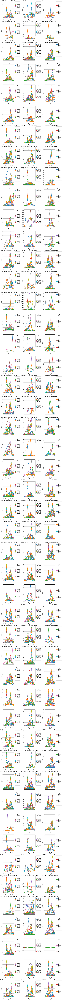

In [65]:
# Filter data for IN direction only
df_in = traffic_agg_rich[traffic_agg_rich['richting'] == 'IN']

import math
site_groups = list(df_in.groupby('siteid'))
n_sites = len(site_groups)
n_cols = 3
n_rows = math.ceil(n_sites / n_cols)

fig, axes = plt.subplots(n_rows, n_cols, figsize=(15, 5 * n_rows), squeeze=False)
axes_flat = axes.flat

for ax, (site_id, group) in zip(axes_flat, site_groups):
    for date, subg in group.groupby('date'):
        ax.plot(subg['hour'], subg['aantal'], marker='o', label=str(date))
    ax.set_title(f'Site {site_id}: Aantal per hour, per date (IN richting)')
    ax.set_xlabel('Hour')
    ax.set_ylabel('Aantal')
    ax.legend(title='Date', bbox_to_anchor=(1.05, 1), loc='upper left')
    ax.margins(x=0)
    ax.grid(True)

# Hide any unused subplots
for extra_ax in axes_flat[len(site_groups):]:
    extra_ax.axis('off')

plt.tight_layout()
plt.show()


### 1.3.4. Central vs outside-central traffic

We compared between central and outside-central municipalities. The classification is an approximation and can later be improved by adding population density data.

,area_type,aantal
0,Central area,516819.0
1,Outside central area,633437.0


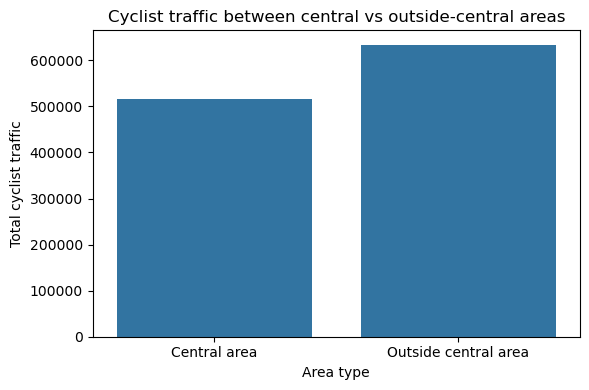

In [66]:
# Determine how traffic differ between central and outside-central areas

central_municipalities = [
    "Antwerpen", "Gent", "Leuven", "Brugge", "Mechelen",
    "Hasselt", "Kortrijk", "Oostende", "Aalst", "Sint-Niklaas"
]

sites_area = sites_df[["siteid", "gemeente", "district"]].copy()
sites_area["gemeente_clean"] = sites_area["gemeente"].astype(str).str.strip().str.lower()
central_clean = [x.lower() for x in central_municipalities]

sites_area["area_type"] = sites_area["gemeente_clean"].apply(
    lambda x: "Central area" if x in central_clean else "Outside central area"
)

traffic_area = traffic_agg_rich.merge(
    sites_area[["siteid", "gemeente", "district", "area_type"]],
    on="siteid",
    how="left"
)

area_traffic = (
    traffic_area.groupby("area_type")["aantal"]
    .sum()
    .reset_index()
)

display(area_traffic)

plt.figure(figsize=(6, 4))
sns.barplot(data=area_traffic, x="area_type", y="aantal")
plt.title("Cyclist traffic between central vs outside-central areas")
plt.xlabel("Area type")
plt.ylabel("Total cyclist traffic")
plt.tight_layout()
plt.show()

### 1.3.3. Further exploration

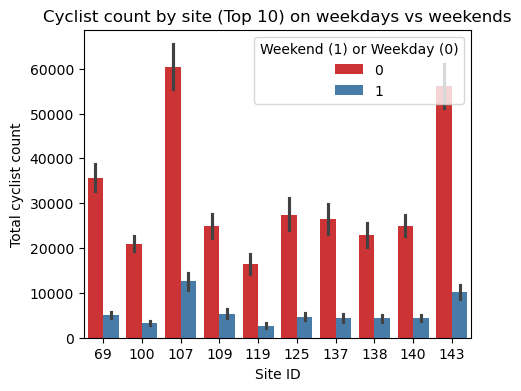

Weekday traffic: 965,708
Weekend traffic: 187,366


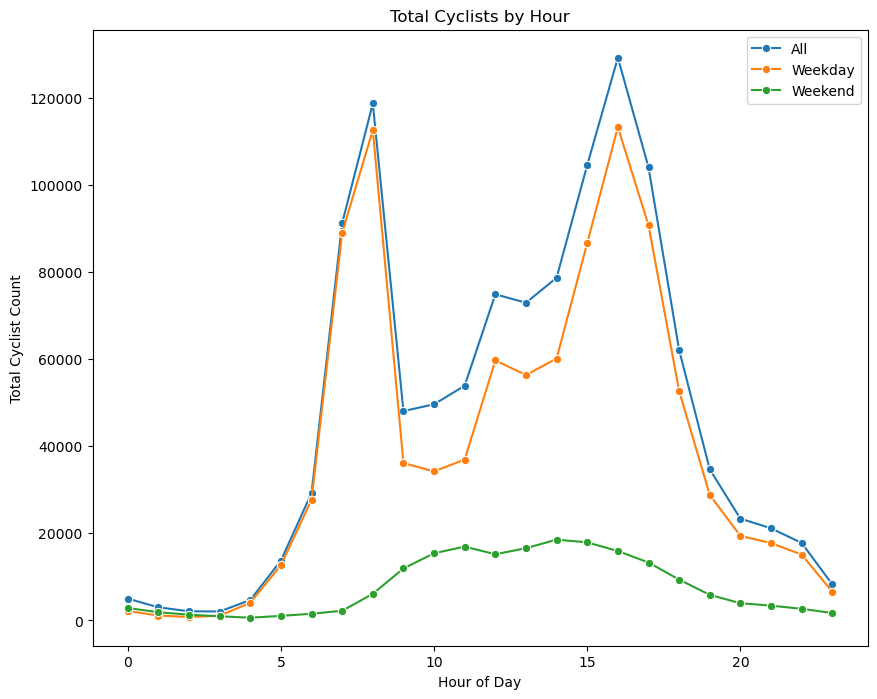

Insight: The highest cyclist traffic occurs around 16:00.
If the highest values appear in the morning and late afternoon, this may indicate commuting-related cycling patterns.


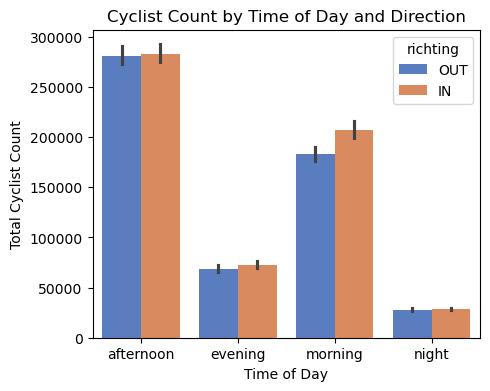

In [67]:
# 1. Total cyclist count per weekday vs weekend for top 10 sites

top10_sites = traffic_agg_rich.groupby('siteid')['aantal'].sum().sort_values(ascending=False).head(10).index
top10_df = traffic_agg_rich[traffic_agg_rich['siteid'].isin(top10_sites)]

plt.figure(figsize=(5, 4))
sns.barplot(
    data=top10_df, 
    x='siteid', 
    y='aantal', 
    hue='weekend', 
    estimator=sum,
    hue_order=[0, 1],
    palette='Set1'
)
plt.title('Cyclist count by site (Top 10) on weekdays vs weekends')
plt.xlabel('Site ID')
plt.ylabel('Total cyclist count')
plt.legend(title='Weekend (1) or Weekday (0)')
plt.show()

# Compare total cyclist traffic between weekdays and weekends.
weekday_weekend_total = traffic_agg_rich.groupby("weekend")["aantal"].sum()
weekday_total = weekday_weekend_total.get(0, 0)
weekend_total = weekday_weekend_total.get(1, 0)

print(f"Weekday traffic: {weekday_total:,.0f}")
print(f"Weekend traffic: {weekend_total:,.0f}") # Traffic is higher during the weekdays

# 2. Total count by hour (all, weekday, weekend)

plt.figure(figsize=(10, 8))
# All days
sns.lineplot(
    data=traffic_agg_rich.groupby('hour')['aantal'].sum().reset_index(), 
    x='hour', y='aantal', marker='o', label='All'
)
# Weekdays
sns.lineplot(
    data=traffic_agg_rich[traffic_agg_rich['weekend']==0].groupby('hour')['aantal'].sum().reset_index(),
    x='hour', y='aantal', marker='o', label='Weekday'
)
# Weekends
sns.lineplot(
    data=traffic_agg_rich[traffic_agg_rich['weekend']==1].groupby('hour')['aantal'].sum().reset_index(),
    x='hour', y='aantal', marker='o', label='Weekend'
)
plt.title('Total Cyclists by Hour')
plt.xlabel('Hour of Day')
plt.ylabel('Total Cyclist Count')
plt.legend()
plt.show()

# Insight: find the busiest hour.
peak_hour = traffic_agg_rich.groupby("hour")["aantal"].sum().idxmax()
print(f"Insight: The highest cyclist traffic occurs around {peak_hour}:00.")
print("If the highest values appear in the morning and late afternoon, this may indicate commuting-related cycling patterns.")

# 3. Cyclist count by direction and time of day

plt.figure(figsize=(5, 4))
sns.barplot(
    data=traffic_agg_rich, 
    x='tod', 
    y='aantal', 
    hue='richting', 
    estimator=sum,
    palette='muted'
)
plt.title('Cyclist Count by Time of Day and Direction')
plt.xlabel('Time of Day')
plt.ylabel('Total Cyclist Count')
plt.show()

# Identify the busiest time-of-day group and dominant direction.
highest_tod = traffic_agg_rich.groupby('tod')['aantal'].sum().idxmax()
highest_direction = traffic_agg_rich.groupby('richting')['aantal'].sum().idxmax() # The highest cycling volume occurs around 16pm


### 1.3.4. Visualization for PyShiny

We made use of PyShiny to visualize total traffic in Flanders in Q4 2025 by direction, municipality, and daytype.

In [68]:
# Create traffic files for Q4 2025 for visualization
traffic_files = [
    "D:/KUL MSDS 1/mda_project/data/traffic/data-2025-10.csv",
    "D:/KUL MSDS 1/mda_project/data/traffic/data-2025-11.csv",
    "D:/KUL MSDS 1/mda_project/data/traffic/data-2025-12.csv",
]

output_path = "D:/KUL MSDS 1/mda_project/data/traffic_q4_2025_aggregated.csv"

traffic_columns = ["siteid", "richting", "type", "van", "tot", "aantal"]

# Process each monthly file
all_agg = []

for file in traffic_files:
    print(f"\nProcessing {os.path.basename(file)}...")

    # Read raw file without header
    df = pd.read_csv(
        file,
        header=None,
        names=traffic_columns
    )

    # Convert timestamps
    df["van"] = pd.to_datetime(df["van"], errors="coerce")
    df["tot"] = pd.to_datetime(df["tot"], errors="coerce")

    # Remove invalid timestamp rows
    df = df[df["van"].notna()]

    # Convert count to numeric
    df["aantal"] = pd.to_numeric(df["aantal"], errors="coerce")
    df = df[df["aantal"].notna()]

    # Keep only cyclist rows
    df = df[df["type"].astype(str).str.upper().eq("FIETSERS")]

    # Keep only Q4-2025
    df = df[(df["van"] >= "2025-10-01") & (df["van"] < "2026-01-01")]

    # Create time features
    df["year"] = df["van"].dt.year
    df["month"] = df["van"].dt.month
    df["day"] = df["van"].dt.day
    df["hour"] = df["van"].dt.hour
    df["weekday"] = df["van"].dt.day_name()
    df["is_weekend"] = df["van"].dt.dayofweek >= 5

    # Aggregate to hourly level per site and direction
    agg = (
        df.groupby(
            [
                "siteid",
                "richting",
                "year",
                "month",
                "day",
                "hour",
                "weekday",
                "is_weekend",
            ],
            as_index=False
        )["aantal"]
        .sum()
        .rename(columns={"aantal": "total_traffic"})
    )

    print("Aggregated shape:", agg.shape)

    all_agg.append(agg)

# Combine all monthly aggregations

traffic_agg = pd.concat(all_agg, ignore_index=True)

## Re-aggregate in case duplicate groups exist across files
traffic_agg = (
    traffic_agg.groupby(
        [
            "siteid",
            "richting",
            "year",
            "month",
            "day",
            "hour",
            "weekday",
            "is_weekend",
        ],
        as_index=False
    )["total_traffic"]
    .sum()
)

# Save final aggregated file

traffic_agg.to_csv(output_path, index=False)

print("Rows:", len(traffic_agg))
print(traffic_agg.head())


Processing data-2025-10.csv...
Aggregated shape: (211478, 9)

Processing data-2025-11.csv...
Aggregated shape: (206874, 9)

Processing data-2025-12.csv...
Aggregated shape: (212220, 9)
Rows: 630572
   siteid richting  year  month  day  hour    weekday  is_weekend  \
0       1       IN  2025     10    1     0  Wednesday       False   
1       1       IN  2025     10    1     1  Wednesday       False   
2       1       IN  2025     10    1     2  Wednesday       False   
3       1       IN  2025     10    1     3  Wednesday       False   
4       1       IN  2025     10    1     4  Wednesday       False   

   total_traffic  
0            1.0  
1            1.0  
2            0.0  
3            2.0  
4            3.0  
